# Подготовка окружения и проверка датасета

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 30.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/78.1 kB 2.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Класс шлагбаума в стандартной YOLOv8: False


Загрузка датасета:   0%|          | 0.00/275M [00:00<?, ?B/s]

Датасет распакован.

Источник: Kaggle
Найденный класс: gate barrier
Номер класса: 13
Изображений со шлагбаумом: 72
Устройство: CPU


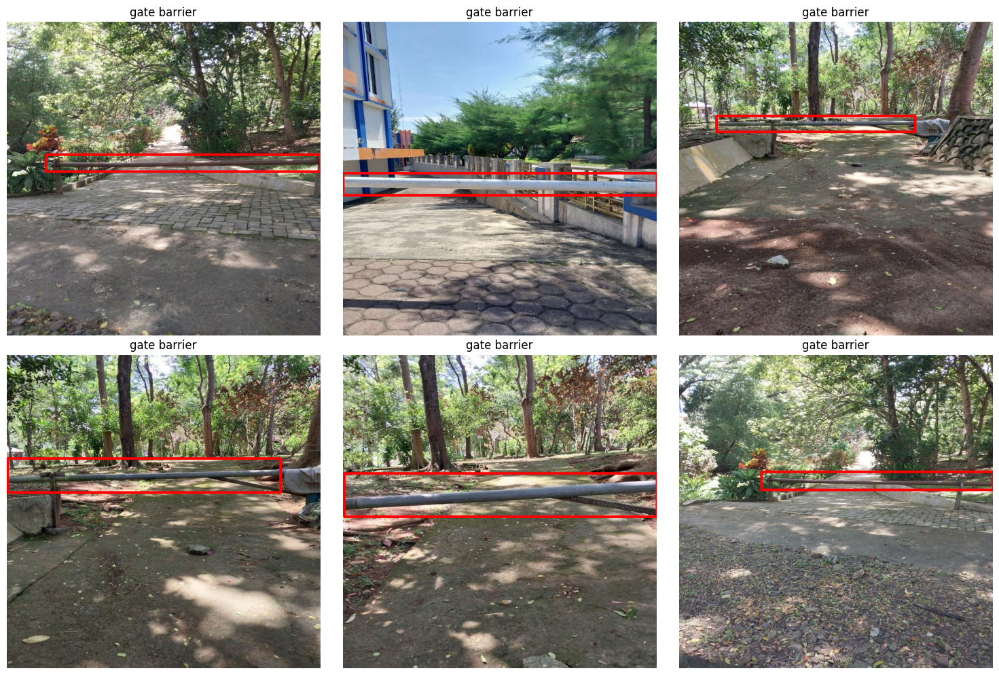

In [1]:
!pip install -q ultralytics flask reportlab openpyxl

import os
import json
import random
import shutil
import sqlite3
import threading
import time
import uuid
import zipfile
from datetime import datetime
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import requests
import torch
import yaml
import matplotlib.pyplot as plt

from PIL import Image
from tqdm.auto import tqdm
from ultralytics import YOLO
from flask import Flask, request, jsonify, render_template_string, send_file
from werkzeug.utils import secure_filename
from reportlab.lib.pagesizes import A4
from reportlab.pdfgen import canvas
from openpyxl import Workbook
from google.colab import files, output

# создаю папки проекта
PROJECT_DIR = Path("/content/barrier_detection")
DATASET_DIR = PROJECT_DIR / "dataset"
RAW_DIR = DATASET_DIR / "raw"
MODELS_DIR = PROJECT_DIR / "models"
RESULTS_DIR = PROJECT_DIR / "results"
TEST_DIR = PROJECT_DIR / "test_images"
REPORTS_DIR = PROJECT_DIR / "reports"

for folder in [
    RAW_DIR,
    MODELS_DIR,
    RESULTS_DIR,
    TEST_DIR,
    REPORTS_DIR
]:
    folder.mkdir(parents=True, exist_ok=True)

# загружаю предобученную YOLOv8
model = YOLO("yolov8n.pt")
standard_classes = list(model.names.values())

print("Класс шлагбаума в стандартной YOLOv8:",
      any(name.lower() in ["barrier", "boom gate", "gate barrier"]
          for name in standard_classes))

# скачиваю открытый датасет с Kaggle
DATASET_URL = (
    "https://www.kaggle.com/api/v1/datasets/download/"
    "muftirestumahesa/obstacles-in-public-spaces-for-dist-yolo"
)

ARCHIVE_PATH = DATASET_DIR / "obstacles_yolo.zip"

if not ARCHIVE_PATH.exists():
    response = requests.get(DATASET_URL, stream=True, timeout=120)
    response.raise_for_status()

    total_size = int(response.headers.get("content-length", 0))

    with open(ARCHIVE_PATH, "wb") as file, tqdm(
        total=total_size,
        unit="B",
        unit_scale=True,
        desc="Загрузка датасета"
    ) as progress:
        for chunk in response.iter_content(chunk_size=1024 * 1024):
            if chunk:
                file.write(chunk)
                progress.update(len(chunk))
else:
    print("Архив датасета уже загружен.")

# распаковываю датасет
annotations_path = RAW_DIR / "_annotations.txt"

if not annotations_path.exists():
    with zipfile.ZipFile(ARCHIVE_PATH, "r") as archive:
        archive.extractall(RAW_DIR)
    print("Датасет распакован.")
else:
    print("Датасет уже распакован.")

# читаю классы и разметку
classes_path = RAW_DIR / "_classes.txt"

with open(classes_path, "r", encoding="utf-8") as file:
    class_names = [
        line.strip()
        for line in file
        if line.strip()
    ]

target_class_name = "gate barrier"
target_class_id = class_names.index(target_class_name)

barrier_annotations = {}

with open(annotations_path, "r", encoding="utf-8") as file:
    for line in file:
        parts = line.strip().split(maxsplit=1)

        if len(parts) != 2:
            continue

        filename, annotation = parts
        values = annotation.split(",")

        if len(values) < 5:
            continue

        x1, y1, x2, y2 = map(int, values[:4])
        class_id = int(values[4])

        if class_id == target_class_id:
            barrier_annotations.setdefault(filename, []).append(
                (x1, y1, x2, y2)
            )

print("\nИсточник: Kaggle")
print("Найденный класс:", target_class_name)
print("Номер класса:", target_class_id)
print("Изображений со шлагбаумом:", len(barrier_annotations))
print("Устройство:", torch.cuda.get_device_name(0)
      if torch.cuda.is_available() else "CPU")

# показываю примеры разметки
sample_names = random.Random(42).sample(
    list(barrier_annotations),
    min(6, len(barrier_annotations))
)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

for axis, filename in zip(axes, sample_names):
    image_path = RAW_DIR / filename
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    for x1, y1, x2, y2 in barrier_annotations[filename]:
        cv2.rectangle(
            image,
            (x1, y1),
            (x2, y2),
            (255, 0, 0),
            3
        )

    axis.imshow(image)
    axis.set_title("gate barrier")
    axis.axis("off")

for axis in axes[len(sample_names):]:
    axis.axis("off")

plt.tight_layout()
plt.show()

Проверил стандартную YOLOv8 и подтвердил, что класса шлагбаума в ней нет. Загрузил с Kaggle набор данных с классом gate barrier и визуально проверил разметку на 72 изображениях.

# Подготовка набора данных для YOLOv8

,Выборка,Со шлагбаумом,Без шлагбаума,Всего
0,train,50,100,150
1,val,14,28,42
2,test,8,16,24


Файл конфигурации: /content/barrier_detection/dataset_yolo/data.yaml


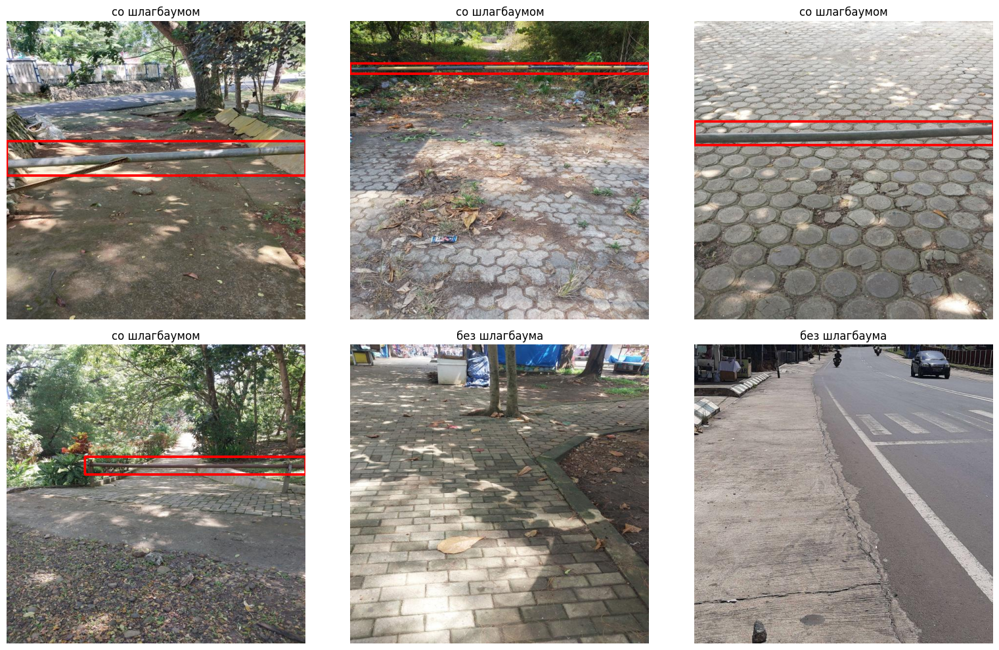

In [2]:
PROJECT_DIR = Path("/content/barrier_detection")
YOLO_DATASET_DIR = PROJECT_DIR / "dataset_yolo"

annotation_file = next(PROJECT_DIR.rglob("_annotations.txt"))

image_paths = [
    path for path in PROJECT_DIR.rglob("*")
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
    and YOLO_DATASET_DIR not in path.parents
]
image_by_name = {path.name: path for path in image_paths}

# считываю исходную разметку
annotations = {}

with open(annotation_file, "r", encoding="utf-8") as file:
    for line in file:
        parts = line.strip().split()

        if len(parts) < 2:
            continue

        image_name = parts[0]
        annotations.setdefault(image_name, [])

        for box_text in parts[1:]:
            values = box_text.split(",")

            if len(values) >= 5:
                try:
                    box = [float(value) for value in values[:5]]
                    annotations[image_name].append(box)
                except ValueError:
                    pass

positive_names = []
negative_names = []

for image_name, boxes in annotations.items():
    if image_name not in image_by_name:
        continue

    has_barrier = any(int(box[4]) == target_class_id for box in boxes)

    if has_barrier:
        positive_names.append(image_name)
    else:
        negative_names.append(image_name)

# добавляю изображения без шлагбаума
rng = random.Random(42)
negative_count = min(len(positive_names) * 2, len(negative_names))
selected_negative_names = rng.sample(negative_names, negative_count)

def split_names(names, seed):
    items = sorted(names)
    random.Random(seed).shuffle(items)

    train_end = int(len(items) * 0.70)
    val_end = train_end + int(len(items) * 0.20)

    return {
        "train": items[:train_end],
        "val": items[train_end:val_end],
        "test": items[val_end:]
    }

positive_split = split_names(positive_names, 42)
negative_split = split_names(selected_negative_names, 43)

dataset_split = {}

for split_name in ["train", "val", "test"]:
    dataset_split[split_name] = (
        positive_split[split_name] + negative_split[split_name]
    )
    random.Random(44).shuffle(dataset_split[split_name])

    (YOLO_DATASET_DIR / "images" / split_name).mkdir(
        parents=True, exist_ok=True
    )
    (YOLO_DATASET_DIR / "labels" / split_name).mkdir(
        parents=True, exist_ok=True
    )

# преобразую разметку в формат YOLO
for split_name, image_names in dataset_split.items():
    for image_name in image_names:
        source_path = image_by_name[image_name]
        image = cv2.imread(str(source_path))

        if image is None:
            continue

        height, width = image.shape[:2]
        destination_path = YOLO_DATASET_DIR / "images" / split_name / image_name

        if not destination_path.exists():
            shutil.copy2(source_path, destination_path)

        yolo_labels = []

        for box in annotations.get(image_name, []):
            x1, y1, x2, y2, class_id = box

            if int(class_id) != target_class_id:
                continue

            x1, x2 = sorted((max(0, x1), min(width, x2)))
            y1, y2 = sorted((max(0, y1), min(height, y2)))

            if x2 <= x1 or y2 <= y1:
                continue

            center_x = ((x1 + x2) / 2) / width
            center_y = ((y1 + y2) / 2) / height
            box_width = (x2 - x1) / width
            box_height = (y2 - y1) / height

            yolo_labels.append(
                f"0 {center_x:.6f} {center_y:.6f} "
                f"{box_width:.6f} {box_height:.6f}"
            )

        label_path = (
            YOLO_DATASET_DIR
            / "labels"
            / split_name
            / f"{Path(image_name).stem}.txt"
        )
        label_path.write_text("\n".join(yolo_labels), encoding="utf-8")

DATA_YAML = YOLO_DATASET_DIR / "data.yaml"

data_config = {
    "path": str(YOLO_DATASET_DIR),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {0: "barrier"}
}

with open(DATA_YAML, "w", encoding="utf-8") as file:
    yaml.safe_dump(data_config, file, allow_unicode=True, sort_keys=False)

statistics = []

for split_name in ["train", "val", "test"]:
    positive_count = len(positive_split[split_name])
    negative_count = len(negative_split[split_name])

    statistics.append({
        "Выборка": split_name,
        "Со шлагбаумом": positive_count,
        "Без шлагбаума": negative_count,
        "Всего": positive_count + negative_count
    })

display(pd.DataFrame(statistics))
print(f"Файл конфигурации: {DATA_YAML}")

# проверяю готовую разметку
sample_names = (
    positive_split["train"][:4]
    + negative_split["train"][:2]
)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))

for axis, image_name in zip(axes.ravel(), sample_names):
    image = cv2.imread(str(image_by_name[image_name]))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = image.shape[:2]
    found_barrier = False

    for box in annotations.get(image_name, []):
        x1, y1, x2, y2, class_id = box

        if int(class_id) == target_class_id:
            found_barrier = True
            cv2.rectangle(
                image,
                (int(x1), int(y1)),
                (int(x2), int(y2)),
                (255, 0, 0),
                4
            )

    axis.imshow(image)
    axis.set_title(
        "со шлагбаумом" if found_barrier else "без шлагбаума"
    )
    axis.axis("off")

plt.tight_layout()
plt.show()

Подготовил набор данных в формате YOLO: 150 изображений попали в обучающую выборку, 42 — в проверочную и 24 — в тестовую. Разметка шлагбаумов и изображения без шлагбаумов сохранились корректно.

# Обучение модели YOLOv8

Устройство для обучения: cpu
Размер пакета: 8
Ultralytics 8.4.154 🚀 Python-3.13.15 torch-2.11.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/barrier_detection/dataset_yolo/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, m

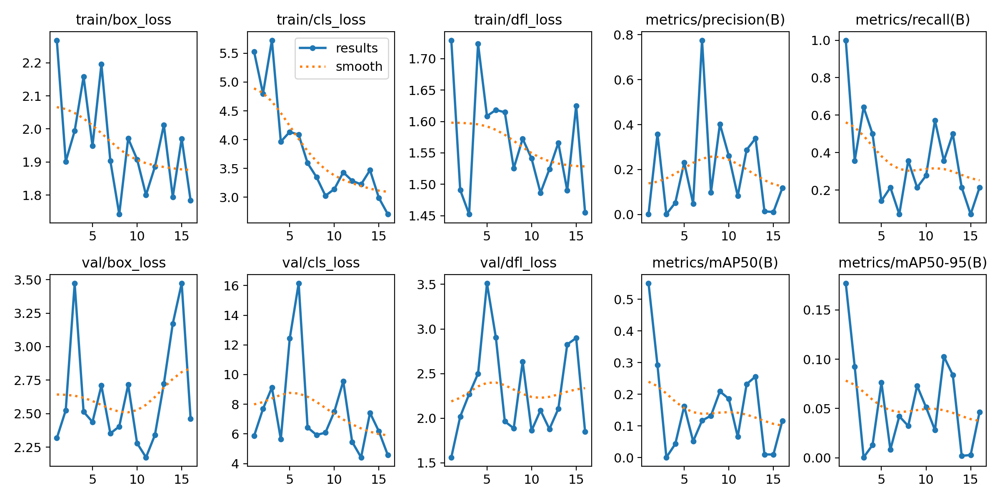

In [3]:
TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 16 if torch.cuda.is_available() else 8
RUN_NAME = f"barrier_yolov8n_{int(time.time())}"

print(f"Устройство для обучения: {TRAIN_DEVICE}")
print(f"Размер пакета: {BATCH_SIZE}")

# загружаю предобученную модель
training_model = YOLO("yolov8n.pt")

# обучаю модель находить шлагбаумы
train_results = training_model.train(
    data=str(DATA_YAML),
    epochs=50,
    imgsz=512,
    batch=BATCH_SIZE,
    device=TRAIN_DEVICE,
    project=str(PROJECT_DIR / "runs"),
    name=RUN_NAME,
    pretrained=True,
    patience=15,
    optimizer="auto",
    workers=2,
    cache=True,
    seed=42,
    plots=True,
    save=True,
    verbose=True
)

RUN_DIR = PROJECT_DIR / "runs" / RUN_NAME
BEST_WEIGHTS = RUN_DIR / "weights" / "best.pt"

print(f"\nЛучшие веса сохранены: {BEST_WEIGHTS}")
print(f"Файл существует: {BEST_WEIGHTS.exists()}")

results_image = RUN_DIR / "results.png"

if results_image.exists():
    display(Image.open(results_image))

Обучил модель YOLOv8 на подготовленном датасете. Обучение остановилось на 16-й эпохе из-за отсутствия улучшения метрик в течение 15 эпох; показатели заметно колебались, поэтому дальше проверю лучшие сохранённые веса на тестовых изображениях.

# Сохранение результатов обучения

In [5]:
runs_directory = PROJECT_DIR / "runs"

run_folders = [
    path for path in runs_directory.glob("barrier_yolov8n_*")
    if path.is_dir()
]

if not run_folders:
    raise FileNotFoundError("Папка с результатами обучения не найдена.")

LATEST_RUN_DIR = max(
    run_folders,
    key=lambda path: path.stat().st_mtime
)

BEST_WEIGHTS = LATEST_RUN_DIR / "weights" / "best.pt"
LAST_WEIGHTS = LATEST_RUN_DIR / "weights" / "last.pt"

if not BEST_WEIGHTS.exists():
    raise FileNotFoundError("Файл best.pt не найден.")

project_info = {
    "model": "YOLOv8n",
    "class_name": "barrier",
    "source_class": "gate barrier",
    "run_folder": LATEST_RUN_DIR.name,
    "best_weights": str(BEST_WEIGHTS.relative_to(PROJECT_DIR)),
    "last_weights": str(LAST_WEIGHTS.relative_to(PROJECT_DIR)),
    "data_yaml": str(DATA_YAML.relative_to(PROJECT_DIR))
}

info_path = PROJECT_DIR / "project_info.json"
info_path.write_text(
    json.dumps(project_info, ensure_ascii=False, indent=4),
    encoding="utf-8"
)

BACKUP_ZIP = Path("/content/barrier_project_backup.zip")

# сохраняю датасет, веса и результаты
with zipfile.ZipFile(
    BACKUP_ZIP,
    mode="w",
    compression=zipfile.ZIP_DEFLATED
) as archive:
    folders_to_save = [
        YOLO_DATASET_DIR,
        LATEST_RUN_DIR
    ]

    for folder in folders_to_save:
        for file_path in folder.rglob("*"):
            if file_path.is_file():
                archive_name = (
                    Path("barrier_detection")
                    / file_path.relative_to(PROJECT_DIR)
                )
                archive.write(file_path, archive_name)

    archive.write(
        info_path,
        Path("barrier_detection") / info_path.name
    )

archive_size = BACKUP_ZIP.stat().st_size / (1024 ** 2)

print(f"Папка обучения: {LATEST_RUN_DIR}")
print(f"Лучшие веса: {BEST_WEIGHTS}")
print(f"Размер архива: {archive_size:.1f} МБ")
print("Архив готов.")

files.download(str(BACKUP_ZIP))

Папка обучения: /content/barrier_detection/runs/barrier_yolov8n_1789593023
Лучшие веса: /content/barrier_detection/runs/barrier_yolov8n_1789593023/weights/best.pt
Размер архива: 34.8 МБ
Архив готов.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Сформировал архив размером 34,8 МБ с подготовленным датасетом, весами модели и результатами обучения. Лучшие веса best.pt сохранились корректно и были готовы для дальнейшей проверки.

# Проверка модели на тестовой выборке

Ultralytics 8.4.154 🚀 Python-3.13.15 torch-2.11.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1308.9±222.0 MB/s, size: 87.4 KB)
val: Scanning /content/barrier_detection/dataset_yolo/labels/test... 24 images, 16 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 24/24 1.7Kit/s 0.0s
val: New cache created: /content/barrier_detection/dataset_yolo/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.5s/it 4.4s
                   all         24          8    0.00111          1      0.739      0.224
Speed: 1.4ms preprocess, 156.8ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to /content/barrier_detection/runs/test_1789594673


,Метрика,Значение
0,Precision,0.0011
1,Recall,1.0000
2,mAP50,0.7392
3,mAP50-95,0.2239


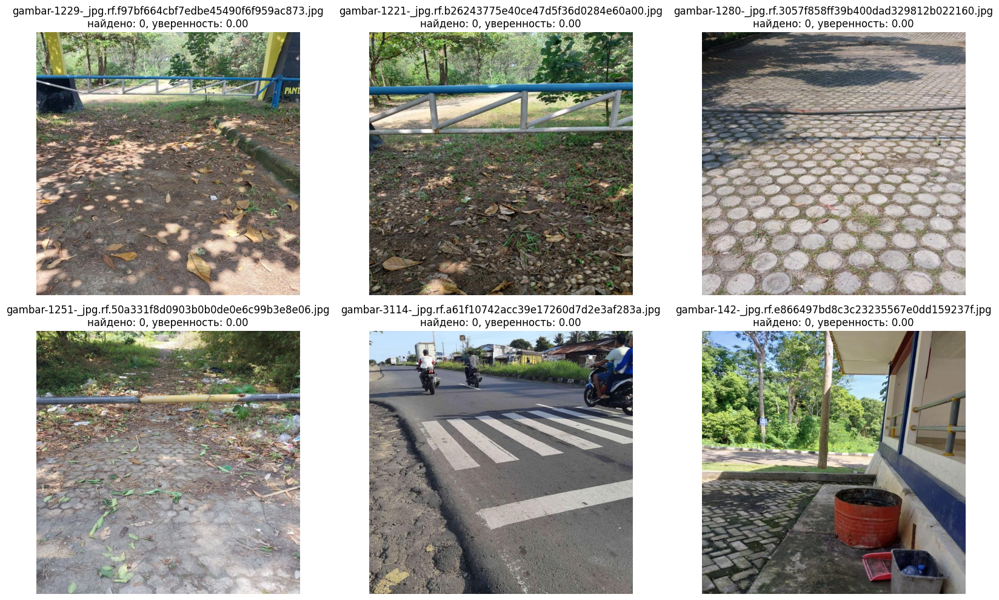

In [6]:
TEST_RUN_NAME = f"test_{int(time.time())}"
CONFIDENCE_THRESHOLD = 0.25

# загружаю лучшие веса
barrier_model = YOLO(str(BEST_WEIGHTS))

# оцениваю модель на тестовой выборке
test_metrics = barrier_model.val(
    data=str(DATA_YAML),
    split="test",
    imgsz=512,
    batch=BATCH_SIZE,
    device=TRAIN_DEVICE,
    project=str(PROJECT_DIR / "runs"),
    name=TEST_RUN_NAME,
    plots=True,
    save_json=False,
    verbose=True
)

metrics_table = pd.DataFrame({
    "Метрика": [
        "Precision",
        "Recall",
        "mAP50",
        "mAP50-95"
    ],
    "Значение": [
        float(test_metrics.box.mp),
        float(test_metrics.box.mr),
        float(test_metrics.box.map50),
        float(test_metrics.box.map)
    ]
})

display(metrics_table.round(4))

# выбираю примеры для визуальной проверки
test_images_directory = YOLO_DATASET_DIR / "images" / "test"
test_labels_directory = YOLO_DATASET_DIR / "labels" / "test"

positive_test_images = []
negative_test_images = []

for image_path in sorted(test_images_directory.glob("*")):
    label_path = test_labels_directory / f"{image_path.stem}.txt"

    if label_path.exists() and label_path.read_text(encoding="utf-8").strip():
        positive_test_images.append(image_path)
    else:
        negative_test_images.append(image_path)

sample_rng = random.Random(42)

sample_images = (
    sample_rng.sample(
        positive_test_images,
        min(4, len(positive_test_images))
    )
    + sample_rng.sample(
        negative_test_images,
        min(2, len(negative_test_images))
    )
)

prediction_results = barrier_model.predict(
    source=[str(path) for path in sample_images],
    imgsz=512,
    conf=CONFIDENCE_THRESHOLD,
    device=TRAIN_DEVICE,
    save=False,
    verbose=False
)

fig, axes = plt.subplots(2, 3, figsize=(17, 10))
axes = axes.ravel()

for axis, image_path, result in zip(
    axes,
    sample_images,
    prediction_results
):
    plotted_image = result.plot()
    plotted_image = cv2.cvtColor(
        plotted_image,
        cv2.COLOR_BGR2RGB
    )

    detected_count = len(result.boxes)
    confidences = result.boxes.conf.cpu().numpy()
    maximum_confidence = (
        float(confidences.max()) if detected_count > 0 else 0
    )

    axis.imshow(plotted_image)
    axis.set_title(
        f"{image_path.name}\n"
        f"найдено: {detected_count}, "
        f"уверенность: {maximum_confidence:.2f}"
    )
    axis.axis("off")

for axis in axes[len(sample_images):]:
    axis.axis("off")

plt.tight_layout()
plt.show()

Проверил модель на тестовой выборке и получил mAP50 0,7392. При стандартном пороге 0,25 модель не выводила рамки, поэтому перешёл к подбору подходящего порога по проверочной выборке

# Подбор порога уверенности модели

Максимальная уверенность модели: 0.0326
Рекомендуемый порог: 0.0210


,Порог,Precision,Recall,F1,Accuracy
26,0.0210,0.8235,1.0000,0.9032,0.9286
25,0.0208,0.7778,1.0000,0.8750,0.9048
27,0.0222,0.8125,0.9286,0.8667,0.9048
24,0.0208,0.7368,1.0000,0.8485,0.8810
28,0.0223,0.8000,0.8571,0.8276,0.8810
23,0.0201,0.7000,1.0000,0.8235,0.8571
22,0.0195,0.6667,1.0000,0.8000,0.8333
29,0.0231,0.7857,0.7857,0.7857,0.8571
21,0.0194,0.6364,1.0000,0.7778,0.8095
31,0.0238,0.8333,0.7143,0.7692,0.8571


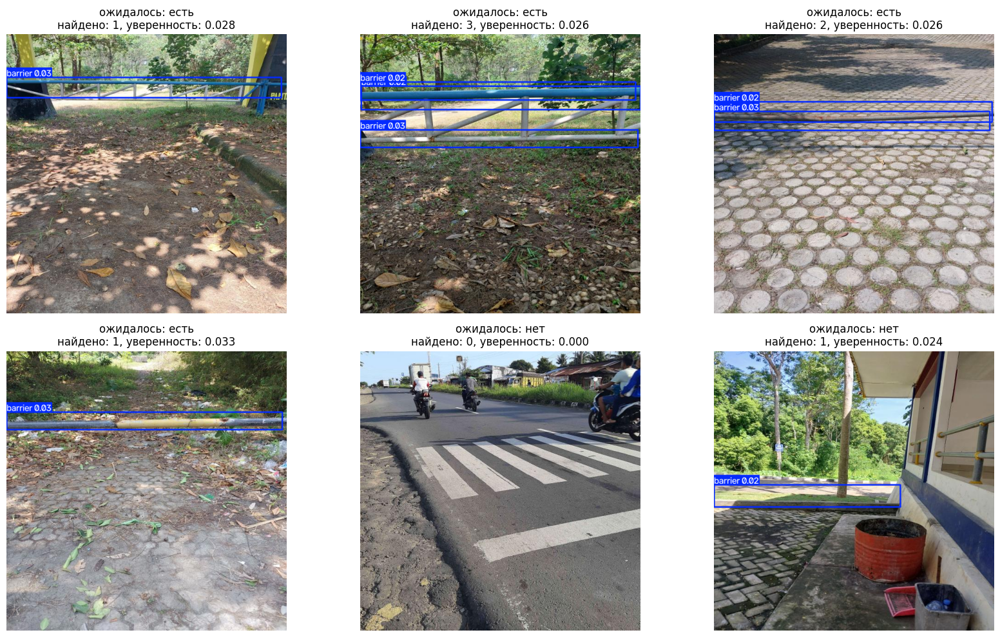

In [7]:
validation_images_directory = YOLO_DATASET_DIR / "images" / "val"
validation_labels_directory = YOLO_DATASET_DIR / "labels" / "val"

validation_images = sorted(
    path for path in validation_images_directory.glob("*")
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

# получаю исходные значения уверенности
validation_results = barrier_model.predict(
    source=[str(path) for path in validation_images],
    imgsz=512,
    conf=0.001,
    iou=0.5,
    max_det=20,
    device=TRAIN_DEVICE,
    save=False,
    verbose=False
)

validation_data = []

for image_path, result in zip(validation_images, validation_results):
    label_path = (
        validation_labels_directory
        / f"{image_path.stem}.txt"
    )

    actual_presence = (
        label_path.exists()
        and bool(label_path.read_text(encoding="utf-8").strip())
    )

    confidences = result.boxes.conf.cpu().numpy()
    maximum_confidence = (
        float(confidences.max()) if len(confidences) > 0 else 0.0
    )

    validation_data.append({
        "image": image_path.name,
        "actual": int(actual_presence),
        "score": maximum_confidence
    })

validation_frame = pd.DataFrame(validation_data)

candidate_thresholds = sorted(
    set(
        [0.001]
        + [
            float(score)
            for score in validation_frame["score"]
            if score >= 0.001
        ]
    )
)

threshold_results = []

for threshold in candidate_thresholds:
    predicted = (
        validation_frame["score"] >= threshold
    ).astype(int)
    actual = validation_frame["actual"]

    true_positive = int(((predicted == 1) & (actual == 1)).sum())
    false_positive = int(((predicted == 1) & (actual == 0)).sum())
    false_negative = int(((predicted == 0) & (actual == 1)).sum())
    true_negative = int(((predicted == 0) & (actual == 0)).sum())

    precision = (
        true_positive / (true_positive + false_positive)
        if true_positive + false_positive > 0 else 0
    )
    recall = (
        true_positive / (true_positive + false_negative)
        if true_positive + false_negative > 0 else 0
    )
    f1_score = (
        2 * precision * recall / (precision + recall)
        if precision + recall > 0 else 0
    )
    accuracy = (
        (true_positive + true_negative) / len(actual)
    )

    threshold_results.append({
        "Порог": threshold,
        "Precision": precision,
        "Recall": recall,
        "F1": f1_score,
        "Accuracy": accuracy
    })

threshold_table = pd.DataFrame(threshold_results)

best_row = threshold_table.sort_values(
    by=["F1", "Accuracy", "Precision"],
    ascending=False
).iloc[0]

RECOMMENDED_CONFIDENCE = float(best_row["Порог"])

print(
    f"Максимальная уверенность модели: "
    f"{validation_frame['score'].max():.4f}"
)
print(
    f"Рекомендуемый порог: "
    f"{RECOMMENDED_CONFIDENCE:.4f}"
)

display(
    threshold_table.sort_values(
        by=["F1", "Accuracy"],
        ascending=False
    ).head(10).round(4)
)

# проверяю подобранный порог
calibrated_results = barrier_model.predict(
    source=[str(path) for path in sample_images],
    imgsz=512,
    conf=RECOMMENDED_CONFIDENCE,
    iou=0.5,
    max_det=10,
    device=TRAIN_DEVICE,
    save=False,
    verbose=False
)

fig, axes = plt.subplots(2, 3, figsize=(17, 10))
axes = axes.ravel()

for axis, image_path, result in zip(
    axes,
    sample_images,
    calibrated_results
):
    plotted_image = cv2.cvtColor(
        result.plot(),
        cv2.COLOR_BGR2RGB
    )

    label_path = (
        test_labels_directory
        / f"{image_path.stem}.txt"
    )
    actual_presence = (
        label_path.exists()
        and bool(label_path.read_text(encoding="utf-8").strip())
    )

    detected_count = len(result.boxes)
    confidences = result.boxes.conf.cpu().numpy()
    maximum_confidence = (
        float(confidences.max()) if detected_count > 0 else 0
    )

    axis.imshow(plotted_image)
    axis.set_title(
        f"ожидалось: {'есть' if actual_presence else 'нет'}\n"
        f"найдено: {detected_count}, "
        f"уверенность: {maximum_confidence:.3f}"
    )
    axis.axis("off")

plt.tight_layout()
plt.show()

Подобрал порог уверенности 0,021 по проверочной выборке. При этом значении accuracy составила 0,9286, а F1-мера — 0,9032; модель начала находить шлагбаумы и выводить рамки на тестовых изображениях.

# Загрузка изображения

Выберите одно изображение со шлагбаумом или без него.


Saving IMG-82f297b41bb8d8444203d474d5439386-V.jpg to IMG-82f297b41bb8d8444203d474d5439386-V.jpg
Шлагбаум обнаружен: да
Количество найденных объектов: 1
Уверенность модели: 0.023
Результат сохранён: /content/barrier_detection/user_results/result_ae1012eb.jpg


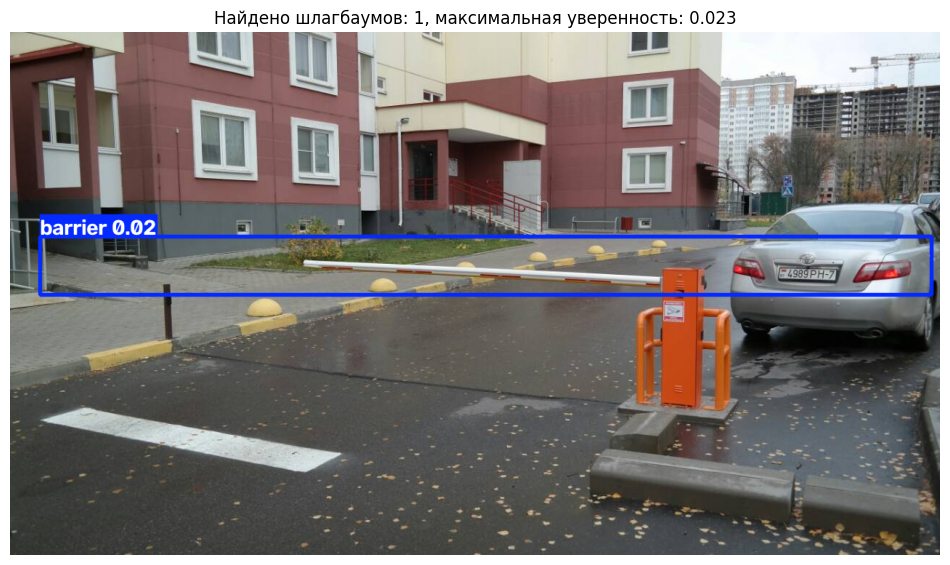

In [8]:
UPLOADS_DIR = PROJECT_DIR / "user_images"
USER_RESULTS_DIR = PROJECT_DIR / "user_results"

UPLOADS_DIR.mkdir(parents=True, exist_ok=True)
USER_RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print("Выберите одно изображение со шлагбаумом или без него.")
uploaded_files = files.upload()

if not uploaded_files:
    raise ValueError("Изображение не было выбрано.")

uploaded_name, uploaded_bytes = next(iter(uploaded_files.items()))

file_extension = Path(uploaded_name).suffix.lower()

if file_extension not in {".jpg", ".jpeg", ".png"}:
    raise ValueError("Поддерживаются только JPG, JPEG и PNG.")

request_id = uuid.uuid4().hex[:8]
input_path = (
    UPLOADS_DIR
    / f"{request_id}_{Path(uploaded_name).name}"
)
input_path.write_bytes(uploaded_bytes)

image = cv2.imread(str(input_path))

if image is None:
    raise ValueError("Не удалось прочитать изображение.")

# выполняю детекцию
user_prediction = barrier_model.predict(
    source=str(input_path),
    imgsz=512,
    conf=RECOMMENDED_CONFIDENCE,
    iou=0.5,
    max_det=10,
    device=TRAIN_DEVICE,
    save=False,
    verbose=False
)[0]

detected_count = len(user_prediction.boxes)
confidences = user_prediction.boxes.conf.cpu().numpy()

maximum_confidence = (
    float(confidences.max()) if detected_count > 0 else 0.0
)

processed_image = user_prediction.plot()

output_path = (
    USER_RESULTS_DIR
    / f"result_{request_id}.jpg"
)
cv2.imwrite(str(output_path), processed_image)

print(
    f"Шлагбаум обнаружен: "
    f"{'да' if detected_count > 0 else 'нет'}"
)
print(f"Количество найденных объектов: {detected_count}")

if detected_count > 0:
    print(
        "Уверенность модели: "
        + ", ".join(
            f"{confidence:.3f}"
            for confidence in confidences
        )
    )

print(f"Результат сохранён: {output_path}")

plt.figure(figsize=(12, 8))
plt.imshow(
    cv2.cvtColor(
        processed_image,
        cv2.COLOR_BGR2RGB
    )
)
plt.title(
    f"Найдено шлагбаумов: {detected_count}, "
    f"максимальная уверенность: {maximum_confidence:.3f}"
)
plt.axis("off")
plt.show()

Загрузил фотографию парковки и проверил модель на новом изображении. Модель нашла один шлагбаум, построила рамку с уверенностью 0,023 и сохранила обработанное изображение.

# Сохранение результата детекции

In [9]:
HISTORY_FILE = PROJECT_DIR / "detection_history.json"

result_record = {
    "request_id": request_id,
    "date": time.strftime("%Y-%m-%d %H:%M:%S"),
    "source_image": input_path.name,
    "barrier_detected": detected_count > 0,
    "barrier_count": detected_count,
    "confidence_threshold": round(RECOMMENDED_CONFIDENCE, 6),
    "confidences": [
        round(float(confidence), 6)
        for confidence in confidences
    ],
    "result_image": output_path.name
}

if HISTORY_FILE.exists():
    try:
        detection_history = json.loads(
            HISTORY_FILE.read_text(encoding="utf-8")
        )
    except json.JSONDecodeError:
        detection_history = []
else:
    detection_history = []

detection_history.append(result_record)

HISTORY_FILE.write_text(
    json.dumps(
        detection_history,
        ensure_ascii=False,
        indent=4
    ),
    encoding="utf-8"
)

result_json_path = (
    USER_RESULTS_DIR
    / f"result_{request_id}.json"
)
result_json_path.write_text(
    json.dumps(
        result_record,
        ensure_ascii=False,
        indent=4
    ),
    encoding="utf-8"
)

RESULT_ZIP = (
    USER_RESULTS_DIR
    / f"barrier_result_{request_id}.zip"
)

# собираю результат в архив
with zipfile.ZipFile(
    RESULT_ZIP,
    mode="w",
    compression=zipfile.ZIP_DEFLATED
) as archive:
    archive.write(
        input_path,
        f"source/{input_path.name}"
    )
    archive.write(
        output_path,
        f"result/{output_path.name}"
    )
    archive.write(
        result_json_path,
        f"result/{result_json_path.name}"
    )

print(f"Запись добавлена в историю: {HISTORY_FILE}")
print(f"Архив с результатом создан: {RESULT_ZIP.name}")

files.download(str(RESULT_ZIP))

Запись добавлена в историю: /content/barrier_detection/detection_history.json
Архив с результатом создан: barrier_result_ae1012eb.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Сохранил исходное и обработанное изображение вместе с данными детекции в архив. Результат также добавился в общую историю запросов в формате JSON.

# Создание веб-интерфейса

In [11]:
WEB_UPLOADS_DIR = PROJECT_DIR / "web_uploads"
WEB_RESULTS_DIR = PROJECT_DIR / "web_results"

WEB_UPLOADS_DIR.mkdir(parents=True, exist_ok=True)
WEB_RESULTS_DIR.mkdir(parents=True, exist_ok=True)

WEB_PORT = 6000 + int(time.time()) % 1000
web_app = Flask("barrier_detection_web")

PAGE_TEMPLATE = """
<!DOCTYPE html>
<html lang="ru">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Анализ наличия шлагбаума</title>

    <style>
        body {
            margin: 0;
            background: #f1f4f8;
            font-family: Arial, sans-serif;
            color: #172033;
        }

        .container {
            max-width: 950px;
            margin: 35px auto;
            padding: 0 18px;
        }

        .card {
            background: #ffffff;
            padding: 28px;
            margin-bottom: 22px;
            border-radius: 14px;
            box-shadow: 0 4px 18px rgba(0, 0, 0, 0.08);
        }

        h1, h2 {
            margin-top: 0;
        }

        .subtitle {
            color: #667085;
            margin-bottom: 24px;
        }

        input[type="file"] {
            display: block;
            margin-bottom: 18px;
        }

        button, .button {
            display: inline-block;
            padding: 12px 20px;
            border: 0;
            border-radius: 8px;
            background: #295bd7;
            color: white;
            text-decoration: none;
            cursor: pointer;
            font-size: 15px;
        }

        button:hover, .button:hover {
            background: #2048aa;
        }

        .message {
            padding: 13px;
            margin-bottom: 18px;
            border-radius: 8px;
            background: #fff3cd;
        }

        .stats {
            display: grid;
            grid-template-columns: repeat(auto-fit, minmax(180px, 1fr));
            gap: 12px;
            margin: 18px 0;
        }

        .stat {
            padding: 15px;
            background: #f5f7fb;
            border-radius: 9px;
        }

        .stat span {
            display: block;
            color: #667085;
            font-size: 13px;
            margin-bottom: 6px;
        }

        .result-image {
            display: block;
            width: 100%;
            margin: 20px 0;
            border-radius: 10px;
        }

        table {
            width: 100%;
            border-collapse: collapse;
            font-size: 14px;
        }

        th, td {
            padding: 11px;
            border-bottom: 1px solid #e5e7eb;
            text-align: left;
        }

        th {
            background: #f5f7fb;
        }
    </style>
</head>

<body>
<div class="container">
    <div class="card">
        <h1>Анализ наличия шлагбаума на парковке</h1>

        <p class="subtitle">
            Загрузите изображение для поиска шлагбаума с помощью YOLOv8.
        </p>

        {% if message %}
            <div class="message">{{ message }}</div>
        {% endif %}

        <form method="POST" enctype="multipart/form-data">
            <input
                type="file"
                name="image"
                accept=".jpg,.jpeg,.png"
                required
            >

            <button type="submit">
                Проверить изображение
            </button>
        </form>
    </div>

    {% if result %}
    <div class="card">
        <h2>Результат детекции</h2>

        <div class="stats">
            <div class="stat">
                <span>Шлагбаум обнаружен</span>
                <strong>
                    {{ "Да" if result.barrier_detected else "Нет" }}
                </strong>
            </div>

            <div class="stat">
                <span>Количество объектов</span>
                <strong>{{ result.barrier_count }}</strong>
            </div>

            <div class="stat">
                <span>Максимальная уверенность</span>
                <strong>
                    {{ "%.3f"|format(result.max_confidence) }}
                </strong>
            </div>

            <div class="stat">
                <span>Порог детекции</span>
                <strong>
                    {{ "%.3f"|format(result.confidence_threshold) }}
                </strong>
            </div>
        </div>

        <img
            class="result-image"
            src="/image/{{ result.result_image }}"
            alt="Обработанное изображение"
        >

        <a
            class="button"
            href="/download/{{ result.result_image }}"
        >
            Скачать обработанное изображение
        </a>
    </div>
    {% endif %}

    <div class="card">
        <h2>История запросов</h2>

        {% if history %}
        <table>
            <thead>
                <tr>
                    <th>Дата</th>
                    <th>Файл</th>
                    <th>Наличие</th>
                    <th>Количество</th>
                    <th>Уверенность</th>
                </tr>
            </thead>

            <tbody>
                {% for item in history[-10:]|reverse %}
                <tr>
                    <td>{{ item.date }}</td>
                    <td>{{ item.source_image }}</td>
                    <td>
                        {{ "Да" if item.barrier_detected else "Нет" }}
                    </td>
                    <td>{{ item.barrier_count }}</td>
                    <td>
                        {{ "%.3f"|format(item.max_confidence) }}
                    </td>
                </tr>
                {% endfor %}
            </tbody>
        </table>
        {% else %}
            <p>История пока пустая.</p>
        {% endif %}

        <p>
            <a class="button" href="/history">
                Открыть историю JSON
            </a>
        </p>
    </div>
</div>
</body>
</html>
"""

def load_web_history():
    if not HISTORY_FILE.exists():
        return []

    try:
        history = json.loads(
            HISTORY_FILE.read_text(encoding="utf-8")
        )
    except json.JSONDecodeError:
        return []

    for item in history:
        if "max_confidence" not in item:
            saved_confidences = item.get("confidences", [])
            item["max_confidence"] = (
                max(saved_confidences)
                if saved_confidences else 0.0
            )

    return history

def save_web_history(history):
    HISTORY_FILE.write_text(
        json.dumps(
            history,
            ensure_ascii=False,
            indent=4
        ),
        encoding="utf-8"
    )

def send_result_file(filename, download=False):
    safe_filename = Path(filename).name
    file_path = WEB_RESULTS_DIR / safe_filename

    if not file_path.exists():
        return web_app.response_class(
            "Файл не найден.",
            status=404,
            mimetype="text/plain"
        )

    mimetype = (
        "image/png"
        if file_path.suffix.lower() == ".png"
        else "image/jpeg"
    )

    headers = {
        "Cache-Control": "no-store"
    }

    if download:
        headers["Content-Disposition"] = (
            f'attachment; filename="{safe_filename}"'
        )

    return web_app.response_class(
        file_path.read_bytes(),
        mimetype=mimetype,
        headers=headers
    )

@web_app.route("/", methods=["GET", "POST"])
def web_index():
    result_record = None
    message = None
    history = load_web_history()

    if request.method == "POST":
        uploaded_file = request.files.get("image")

        if uploaded_file is None or not uploaded_file.filename:
            message = "Файл не был выбран."
        else:
            extension = Path(
                uploaded_file.filename
            ).suffix.lower()

            if extension not in {".jpg", ".jpeg", ".png"}:
                message = "Поддерживаются только JPG, JPEG и PNG."
            else:
                current_id = uuid.uuid4().hex[:8]
                source_name = f"{current_id}{extension}"
                source_path = WEB_UPLOADS_DIR / source_name

                uploaded_file.save(str(source_path))
                source_image = cv2.imread(str(source_path))

                if source_image is None:
                    message = "Не удалось прочитать изображение."
                else:
                    # запускаю детекцию
                    prediction = barrier_model.predict(
                        source=str(source_path),
                        imgsz=512,
                        conf=RECOMMENDED_CONFIDENCE,
                        iou=0.5,
                        max_det=10,
                        device=TRAIN_DEVICE,
                        save=False,
                        verbose=False
                    )[0]

                    found_count = len(prediction.boxes)
                    found_confidences = (
                        prediction.boxes.conf.cpu().numpy()
                    )

                    maximum_confidence = (
                        float(found_confidences.max())
                        if found_count > 0 else 0.0
                    )

                    result_name = f"result_{current_id}.jpg"
                    result_path = WEB_RESULTS_DIR / result_name

                    cv2.imwrite(
                        str(result_path),
                        prediction.plot()
                    )

                    result_record = {
                        "request_id": current_id,
                        "date": time.strftime(
                            "%Y-%m-%d %H:%M:%S"
                        ),
                        "source_image": uploaded_file.filename,
                        "barrier_detected": found_count > 0,
                        "barrier_count": found_count,
                        "confidence_threshold": float(
                            RECOMMENDED_CONFIDENCE
                        ),
                        "confidences": [
                            float(value)
                            for value in found_confidences
                        ],
                        "max_confidence": maximum_confidence,
                        "result_image": result_name
                    }

                    history.append(result_record)
                    save_web_history(history)

    return render_template_string(
        PAGE_TEMPLATE,
        result=result_record,
        message=message,
        history=history
    )

@web_app.route("/image/<filename>")
def web_image(filename):
    return send_result_file(
        filename,
        download=False
    )

@web_app.route("/download/<filename>")
def web_download(filename):
    return send_result_file(
        filename,
        download=True
    )

@web_app.route("/history")
def web_history():
    return web_app.response_class(
        json.dumps(
            load_web_history(),
            ensure_ascii=False,
            indent=4
        ),
        mimetype="application/json"
    )

def start_web_app():
    web_app.run(
        host="0.0.0.0",
        port=WEB_PORT,
        debug=False,
        use_reloader=False
    )

web_thread = threading.Thread(
    target=start_web_app,
    daemon=True
)
web_thread.start()

time.sleep(2)

WEB_URL = output.eval_js(
    f"google.colab.kernel.proxyPort({WEB_PORT})"
)

print(f"Веб-интерфейс запущен: {WEB_URL}")

display(
    {
        "text/html": (
            f'<a href="{WEB_URL}" target="_blank" '
            'style="display:inline-block;padding:12px 20px;'
            'background:#295bd7;color:white;text-decoration:none;'
            'border-radius:8px;font-family:Arial;">'
            'Открыть веб-интерфейс</a>'
        )
    },
    raw=True
)

 * Serving Flask app 'barrier_detection_web'
 * Debug mode: off


INFO:werkzeug:WARNING: This is a development server. Do not use it in a production deployment. Use a production WSGI server instead.
 * Running on all addresses (0.0.0.0)
 * Running on http://127.0.0.1:6373
 * Running on http://172.28.0.12:6373
INFO:werkzeug:Press CTRL+C to quit


Веб-интерфейс запущен: https://6373-m-s-kkb-use1d1-hc85w2s0ubdv-d.us-east1-1.prod.colab.dev


Открыть веб-интерфейс

Создал веб-интерфейс для загрузки изображений и проверки наличия шлагбаума. Обработанное изображение отобразилось на странице, скачивание заработало, а сведения о запросе сохранились в истории.

# Выгрузка истории запросов в Excel

In [13]:
history_records = load_web_history()

EXCEL_REPORT_PATH = (
    PROJECT_DIR
    / "history_barrier_detection.xlsx"
)

history_rows = []

for number, record in enumerate(history_records, start=1):
    history_rows.append({
        "№": number,
        "Дата и время": record.get("date", ""),
        "Исходный файл": record.get("source_image", ""),
        "Шлагбаум обнаружен": (
            "Да" if record.get("barrier_detected") else "Нет"
        ),
        "Количество объектов": record.get(
            "barrier_count",
            0
        ),
        "Порог детекции": round(
            float(record.get("confidence_threshold", 0)),
            4
        ),
        "Максимальная уверенность": round(
            float(record.get("max_confidence", 0)),
            4
        ),
        "Файл результата": record.get(
            "result_image",
            ""
        )
    })

history_frame = pd.DataFrame(history_rows)

project_frame = pd.DataFrame([
    {
        "Параметр": "Тема",
        "Значение": "Анализ наличия шлагбаума на парковке"
    },
    {
        "Параметр": "Архитектура",
        "Значение": "YOLOv8n"
    },
    {
        "Параметр": "Исходная модель",
        "Значение": "Предобученная YOLOv8n"
    },
    {
        "Параметр": "Класс",
        "Значение": "barrier"
    },
    {
        "Параметр": "Источник данных",
        "Значение": "Kaggle"
    },
    {
        "Параметр": "Обучающая выборка",
        "Значение": len(dataset_split["train"])
    },
    {
        "Параметр": "Проверочная выборка",
        "Значение": len(dataset_split["val"])
    },
    {
        "Параметр": "Тестовая выборка",
        "Значение": len(dataset_split["test"])
    },
    {
        "Параметр": "Рабочий порог",
        "Значение": round(RECOMMENDED_CONFIDENCE, 4)
    },
    {
        "Параметр": "mAP50",
        "Значение": round(
            float(test_metrics.box.map50),
            4
        )
    },
    {
        "Параметр": "mAP50-95",
        "Значение": round(
            float(test_metrics.box.map),
            4
        )
    }
])

# сохраняю две таблицы в один файл
with pd.ExcelWriter(
    EXCEL_REPORT_PATH,
    engine="openpyxl"
) as writer:
    history_frame.to_excel(
        writer,
        sheet_name="История запросов",
        index=False
    )

    project_frame.to_excel(
        writer,
        sheet_name="Информация",
        index=False
    )

    history_sheet = writer.sheets["История запросов"]
    info_sheet = writer.sheets["Информация"]

    history_sheet.freeze_panes = "A2"
    info_sheet.freeze_panes = "A2"

    history_sheet.auto_filter.ref = (
        history_sheet.dimensions
    )
    info_sheet.auto_filter.ref = (
        info_sheet.dimensions
    )

    history_widths = [
        7, 22, 38, 23, 22, 19, 26, 30
    ]

    for index, width in enumerate(
        history_widths,
        start=1
    ):
        column_letter = chr(64 + index)
        history_sheet.column_dimensions[
            column_letter
        ].width = width

    info_sheet.column_dimensions["A"].width = 30
    info_sheet.column_dimensions["B"].width = 48

print(f"Количество записей: {len(history_records)}")
print(f"Excel-файл сохранён: {EXCEL_REPORT_PATH}")

files.download(str(EXCEL_REPORT_PATH))

Количество записей: 3
Excel-файл сохранён: /content/barrier_detection/history_barrier_detection.xlsx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Выгрузил три записи из истории запросов в Excel. файл сохранился вместе с информацией о модели, датасете и полученных метриках.

# Подготовка материалов для итогового отчёта

In [14]:
REPORT_MATERIALS_DIR = (
    PROJECT_DIR
    / "report_materials"
)
REPORT_MATERIALS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

results_csv_path = LATEST_RUN_DIR / "results.csv"

if results_csv_path.exists():
    completed_epochs = len(
        pd.read_csv(results_csv_path)
    )
else:
    completed_epochs = 0

project_summary = {
    "Тема": "Анализ наличия шлагбаума на парковке",
    "Архитектура": "YOLOv8n",
    "Предобученная модель": "yolov8n.pt",
    "Класс модели": "barrier",
    "Исходный класс датасета": "gate barrier",
    "Источник данных": (
        "Kaggle: Obstacles in Public Spaces for Dist-YOLO"
    ),
    "Обучающих изображений": len(
        dataset_split["train"]
    ),
    "Проверочных изображений": len(
        dataset_split["val"]
    ),
    "Тестовых изображений": len(
        dataset_split["test"]
    ),
    "Выполнено эпох": completed_epochs,
    "Precision": round(
        float(test_metrics.box.mp),
        4
    ),
    "Recall": round(
        float(test_metrics.box.mr),
        4
    ),
    "mAP50": round(
        float(test_metrics.box.map50),
        4
    ),
    "mAP50-95": round(
        float(test_metrics.box.map),
        4
    ),
    "Рабочий порог": round(
        RECOMMENDED_CONFIDENCE,
        4
    ),
    "Записей в истории": len(
        load_web_history()
    ),
    "Лучшие веса": str(
        BEST_WEIGHTS.relative_to(PROJECT_DIR)
    )
}

summary_json_path = (
    REPORT_MATERIALS_DIR
    / "project_summary.json"
)
summary_json_path.write_text(
    json.dumps(
        project_summary,
        ensure_ascii=False,
        indent=4
    ),
    encoding="utf-8"
)

summary_text_path = (
    REPORT_MATERIALS_DIR
    / "project_summary.txt"
)
summary_text_path.write_text(
    "\n".join(
        f"{key}: {value}"
        for key, value in project_summary.items()
    ),
    encoding="utf-8"
)

# сохраняю основные графики
training_plot = LATEST_RUN_DIR / "results.png"

if training_plot.exists():
    shutil.copy2(
        training_plot,
        REPORT_MATERIALS_DIR
        / "training_results.png"
    )

test_run_directories = sorted(
    [
        path for path in (PROJECT_DIR / "runs").glob("test_*")
        if path.is_dir()
    ],
    key=lambda path: path.stat().st_mtime
)

if test_run_directories:
    latest_test_directory = test_run_directories[-1]

    for filename in [
        "confusion_matrix.png",
        "confusion_matrix_normalized.png",
        "PR_curve.png",
        "F1_curve.png"
    ]:
        source_file = (
            latest_test_directory
            / filename
        )

        if source_file.exists():
            shutil.copy2(
                source_file,
                REPORT_MATERIALS_DIR / filename
            )

# сохраняю пример детекции
result_images = sorted(
    list(USER_RESULTS_DIR.glob("*.jpg"))
    + list(WEB_RESULTS_DIR.glob("*.jpg")),
    key=lambda path: path.stat().st_mtime
)

if result_images:
    shutil.copy2(
        result_images[-1],
        REPORT_MATERIALS_DIR
        / "detection_example.jpg"
    )

readme_path = (
    REPORT_MATERIALS_DIR
    / "README.txt"
)
readme_path.write_text(
    "Состав архива:\n"
    "- dataset_yolo — подготовленный датасет;\n"
    "- runs — веса, метрики и графики обучения;\n"
    "- user_results и web_results — результаты детекции;\n"
    "- report_materials — материалы для отчёта;\n"
    "- detection_history.json — история запросов;\n"
    "- history_barrier_detection.xlsx — история в Excel.\n\n"
    "Для продолжения работы повторное обучение не требуется. "
    "Нужно загрузить best.pt через YOLO и использовать "
    f"порог {RECOMMENDED_CONFIDENCE:.4f}.",
    encoding="utf-8"
)

FINAL_ARCHIVE = Path(
    "/content/barrier_detection_final.zip"
)

items_to_save = [
    YOLO_DATASET_DIR,
    PROJECT_DIR / "runs",
    PROJECT_DIR / "user_images",
    PROJECT_DIR / "user_results",
    PROJECT_DIR / "web_uploads",
    PROJECT_DIR / "web_results",
    REPORT_MATERIALS_DIR,
    HISTORY_FILE,
    EXCEL_REPORT_PATH,
    PROJECT_DIR / "project_info.json"
]

added_files = set()

with zipfile.ZipFile(
    FINAL_ARCHIVE,
    mode="w",
    compression=zipfile.ZIP_DEFLATED
) as archive:
    for item in items_to_save:
        if not item.exists():
            continue

        paths = (
            [item]
            if item.is_file()
            else [
                path for path in item.rglob("*")
                if path.is_file()
            ]
        )

        for file_path in paths:
            archive_name = (
                Path("barrier_detection")
                / file_path.relative_to(PROJECT_DIR)
            )

            archive_name_text = str(archive_name)

            if archive_name_text not in added_files:
                archive.write(
                    file_path,
                    archive_name
                )
                added_files.add(
                    archive_name_text
                )

archive_size = (
    FINAL_ARCHIVE.stat().st_size
    / (1024 ** 2)
)

print(
    f"Материалов подготовлено: "
    f"{len(list(REPORT_MATERIALS_DIR.glob('*')))}"
)
print(
    f"Размер итогового архива: "
    f"{archive_size:.1f} МБ"
)
print(
    f"Итоговый архив: {FINAL_ARCHIVE}"
)

files.download(str(FINAL_ARCHIVE))

Материалов подготовлено: 7
Размер итогового архива: 42.0 МБ
Итоговый архив: /content/barrier_detection_final.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Вывод по работе

в этой работе я сделал программу, которая проверяла наличие шлагбаума на фотографии парковки. Сначала попробовал использовать стандартную модель YOLOv8, но отдельного класса для шлагбаума в ней не оказалось. Поэтому взял подходящий датасет с Kaggle, подготовил изображения и разметку, после чего обучил модель на нужном классе.

На тестовых изображениях модель получила mAP50 0,7392. После настройки порога она находила шлагбаумы на новых фотографиях, выделяла их рамкой и показывала количество найденных объектов. Также я сделал простой сайт, через который можно загрузить фотографию, посмотреть результат и скачать обработанное изображение. История проверок сохранялась в JSON и выгружалась в Excel.